<a href="https://colab.research.google.com/github/gabrieldimas/elibrary-mobile-app/blob/main/KTP_ocr%20part%202.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab import drive
from google.colab.patches import cv2_imshow
import glob
import imutils
from imutils import contours
import joblib


In [ ]:
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


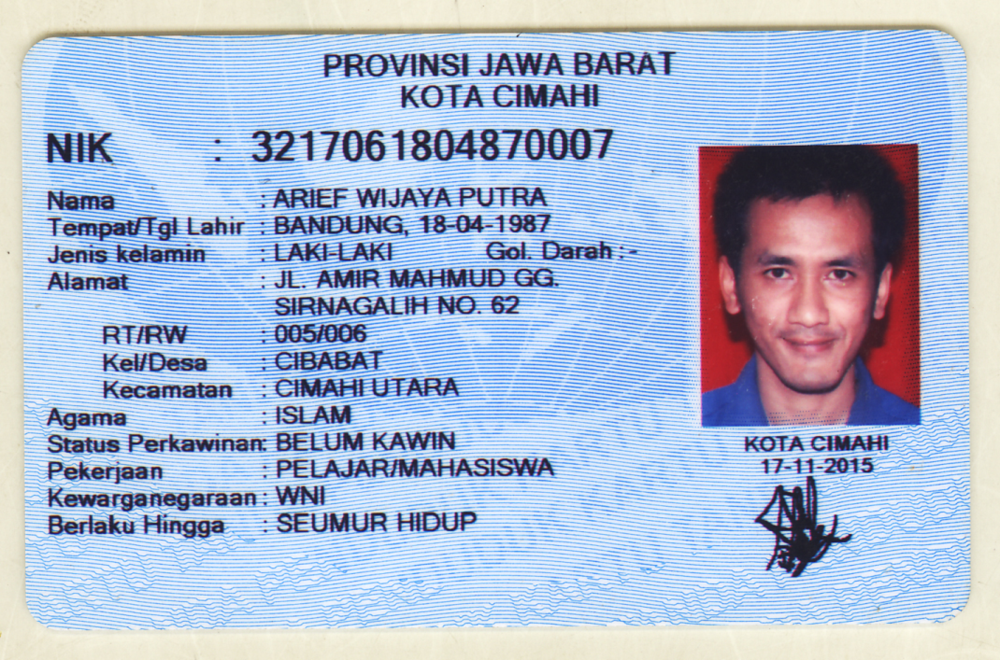

In [ ]:
ori_img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/KTP_More/KTP_More/ktp2.png')
ori_img = imutils.resize(ori_img,width=2560)
cv2_imshow(ori_img)

In [ ]:
def filter_image(img):
  gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
  clahe = cv2.createCLAHE(clipLimit=0.5, tileGridSize=(12, 12))
  clahed = clahe.apply(gray)
  gaussian = cv2.GaussianBlur(clahed,(3,3),0)
  median = cv2.medianBlur(gaussian,7)
  thresholded = cv2.threshold(gaussian,165,255,cv2.THRESH_TRUNC + cv2.THRESH_OTSU)[1]
  binary = cv2.threshold(thresholded,127,255,cv2.THRESH_BINARY_INV)[1]

  return binary

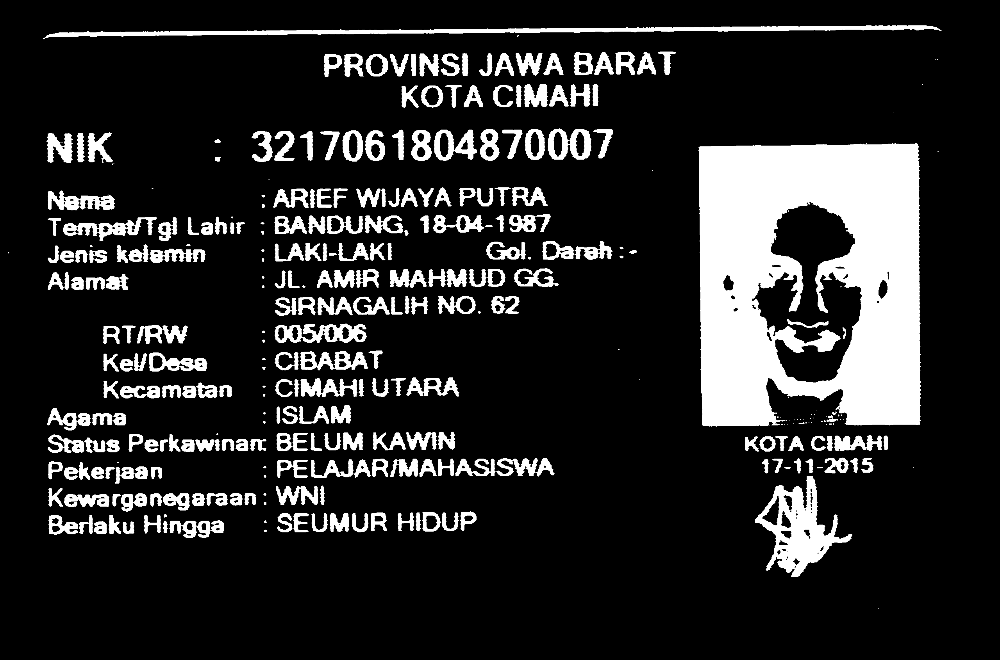

In [ ]:
filtered_img = filter_image(ori_img.copy())
cv2_imshow(filtered_img)


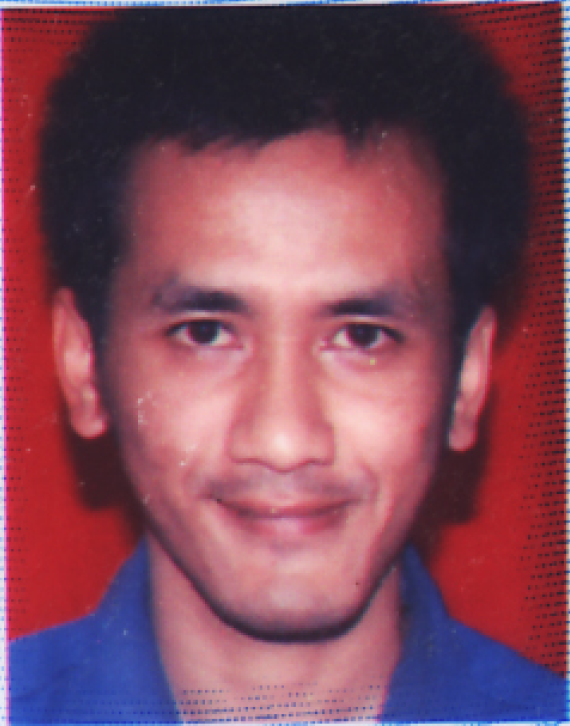

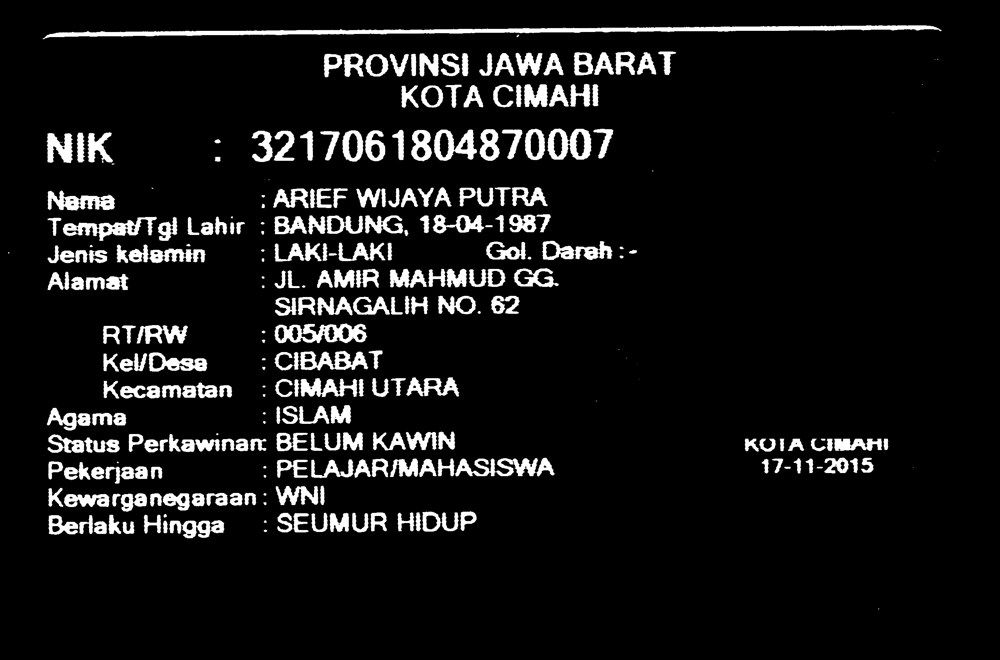

In [ ]:
cnts = cv2.findContours(filtered_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
cnts = imutils.grab_contours(cnts)
cnts = contours.sort_contours(cnts, method="left-to-right")[0]


largest_areas = sorted(cnts, key=cv2.contourArea)
x, y, w, h = cv2.boundingRect(largest_areas[-1])
cv2.rectangle(filtered_img, (x, y), (x + w, y + h+30), (0, 0, 0), -1)
resized = imutils.resize(ori_img,width=2560)
foto_ktp = resized[y:y+h, x:x+w]

# remove big chunk
for cnt in cnts:
  x, y, w, h = cv2.boundingRect(cnt)
  if(w > 100 and  h > 100):
    cv2.rectangle(filtered_img, (x, y), (x + w, y + h), (0, 0, 0), -1)

cv2_imshow(foto_ktp)
cv2_imshow(filtered_img)



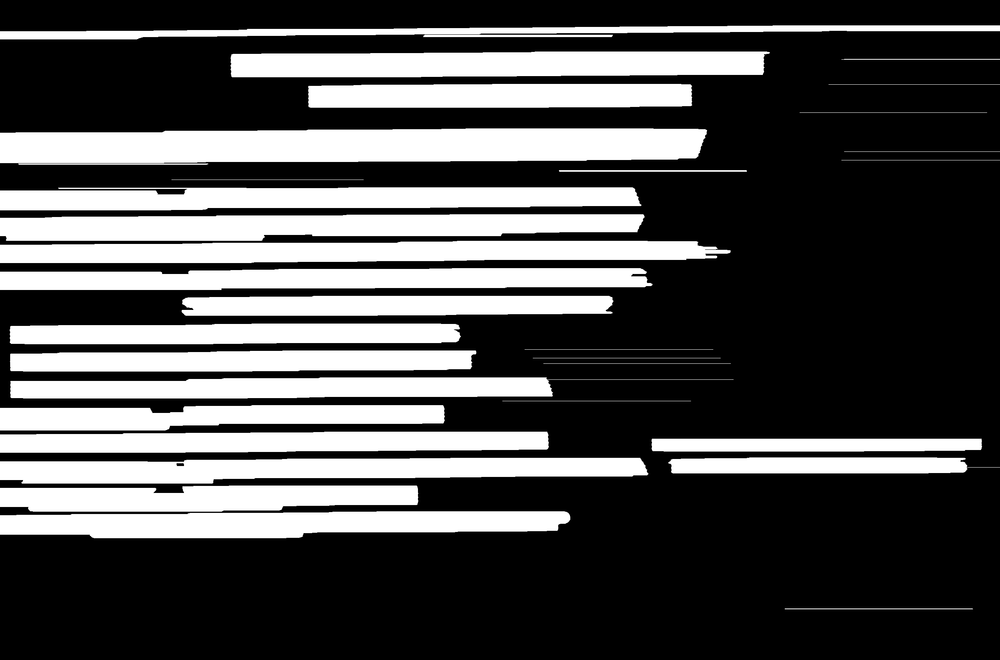

In [ ]:
rect_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (480,1))
dilation = cv2.dilate(filtered_img, rect_kernel, iterations = 1)
cv2_imshow(dilation)

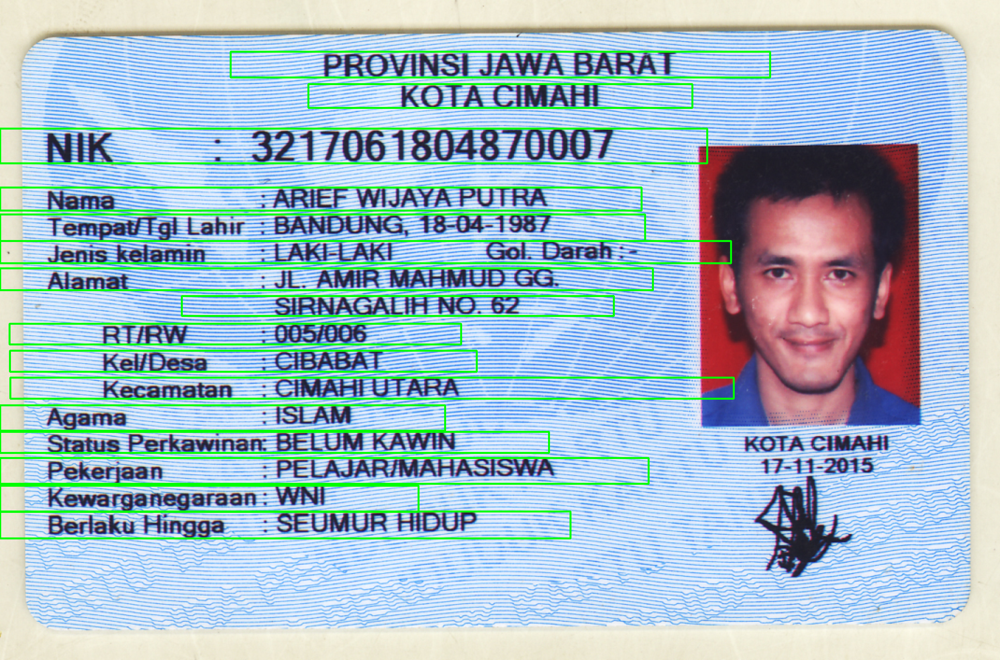

In [ ]:
cnts = cv2.findContours(dilation, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
cnts = imutils.grab_contours(cnts)
cnts = contours.sort_contours(cnts, method="top-to-bottom")[0]
im2 = ori_img.copy()
ktp_roi=[]

for cnt in cnts:
        x, y, w, h = cv2.boundingRect(cnt)
        if(50 < w and 50 < h < 100):
          cv2.rectangle(im2, (x, y), (x + w, y + h), (0, 255, 0), 4)
          ktp_roi.append(filtered_img[y:y+h, x:x+w])
cv2_imshow(im2)

In [ ]:
from tensorflow.keras.models import load_model


# model_path = "/content/drive/MyDrive/PCVK/models/custom_ocr_4_20ep_94_model"
# model_path =  "/content/drive/MyDrive/PCVK/models/custom_ocr_6_bs128_20ep_Bn_66_model.h5"
model_path = "/content/drive/MyDrive/dataset ktm/model_ocr.h5"

model = load_model(model_path)


# class_mapping = {
#     0: '0', 1: '1', 2: '2', 3: '3', 4: '4',
#     5: '5', 6: '6', 7: '7', 8: '8', 9: '9',
#     10: 'A', 11: 'B', 12: 'C', 13: 'D', 14: 'E',
#     15: 'F', 16: 'G', 17: 'H', 18: 'I', 19: 'J',
#     20: 'K', 21: 'L', 22: 'M', 23: 'N', 24: 'O',
#     25: 'P', 26: 'Q', 27: 'R', 28: 'S', 29: 'T',
#     30: 'U', 31: 'V', 32: 'W', 33: 'X', 34: 'Y', 35: 'Z'
# }
# class_mapping = [
#     '!', '"', '#', '$', '%', '&', "'", '(', ')', '*',
#     '+', ',', '-', '.', '/', '0', '1', '2', '3', '4',
#     '5', '6', '7', '8', '9', ':', ';', '<', '=', '>',
#     '?', '@', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H',
#     'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R',
#     'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z', 'W', 'X',
#     'Y', 'Z', '!', '"', 'a', 'b', 'c', 'd', "e", 'f',
#     'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p',
#     'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z',
#     '{', '|', '}', '~']

class_mapping = ['6',  'D',  'f',  '/',  'F',  'x',  'J',  '8',  'H',  'k',  '1',
                 'g',  '2',  'd',  '3',  't',  '.',  '4',  'o',  'y',  'A',
                 'u',  'G',  '-',  'm',  'W',  'c',  '9',  'N',  'P',  'X',
                  'h',  '7',  'j',  '5',  'b',  'w',  'l',  '0',  'I',  'Y',
                   ':',  'T',  'K',  'E',  'V',  'M',  'S',  'a',  'i',  'r',
                    'p',  'e',  'U',  's', 'C',  'q',  'n',  'B',  'z',  'v',
                     'O',  'R',  'Z',  'Q',  'L']
#digits = '0123456789'
#letters = 'ABCDEFGHIJKLMNOPQRSTUVWZYZ'
#char_list = digits + letters
#char_list = [ch for ch in char_list]

def get_text_roi(image):
  text_roi=[]
  cnts = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
  cnts = imutils.grab_contours(cnts)
  cnts = contours.sort_contours(cnts, method="left-to-right")[0]

  for cnt in cnts:
        x, y, w, h = cv2.boundingRect(cnt)
        if(w > 4 and h > 20):
          padded = cv2.copyMakeBorder(image[y:y+h, x:x+w],20,20,20,20, cv2.BORDER_CONSTANT)


          padded = cv2.resize(padded,(28,28))
          # padded = 255 - padded
          cv2_imshow(padded)
          pad = np.array(padded)
          pad = pad / 255.0
          pad_vector = pad.reshape((-1, 1))
          padded = pad_vector.reshape(-1, 28, 28, 1)

          pred = model.predict(padded)
          pred_conf = np.amax(pred)
          pred_index = np.argmax(pred)
          print(f'model pred idx: {pred_index}')
          print(f'model pred conf: {pred_conf}')
          print(f'model pred label: {class_mapping[pred_index]}')
          text_roi.append(f'{class_mapping[pred_index]}')
  return text_roi

In [ ]:
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.


In [ ]:
def grab_text(ktp_roi,index):
  rect_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (40,40))
  dlt = cv2.dilate(ktp_roi, rect_kernel, iterations = 1)

  cnts = cv2.findContours(dlt, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
  cnts = imutils.grab_contours(cnts)
  cnts = contours.sort_contours(cnts, method="left-to-right")[0]
  x, y, w, h = cv2.boundingRect(cnts[index])

  return ktp_roi[y:y+h, x:x+w]

1/1 [==============================] - 0s 236ms/step
model pred idx: 25
model pred conf: 0.9999905824661255
model pred label: P


1/1 [==============================] - 0s 46ms/step
model pred idx: 27
model pred conf: 0.9813674092292786
model pred label: R


1/1 [==============================] - 0s 48ms/step
model pred idx: 0
model pred conf: 0.770529568195343
model pred label: 0


1/1 [==============================] - 0s 45ms/step
model pred idx: 31
model pred conf: 0.9914517998695374
model pred label: V


1/1 [==============================] - 0s 44ms/step
model pred idx: 1
model pred conf: 0.9998892545700073
model pred label: 1


1/1 [==============================] - 0s 40ms/step
model pred idx: 23
model pred conf: 0.9996824264526367
model pred label: N


1/1 [==============================] - 0s 42ms/step
model pred idx: 28
model pred conf: 0.9581297636032104
model pred label: S


1/1 [==============================] - 0s 46ms/step
model pred idx: 1
model pred conf: 0.9981328845024109
model pred label: 1


1/1 [==============================] - 0s 54ms/step
model pred idx: 19
model pred conf: 0.9889872670173645
model pred label: J


1/1 [==============================] - 0s 45ms/step
model pred idx: 10
model pred conf: 0.9998558759689331
model pred label: A


1/1 [==============================] - 0s 44ms/step
model pred idx: 32
model pred conf: 0.9890622496604919
model pred label: W


1/1 [==============================] - 0s 45ms/step
model pred idx: 10
model pred conf: 0.9913166761398315
model pred label: A


1/1 [==============================] - 0s 46ms/step
model pred idx: 11
model pred conf: 0.9999585151672363
model pred label: B


1/1 [==============================] - 0s 43ms/step
model pred idx: 10
model pred conf: 0.9957648515701294
model pred label: A


1/1 [==============================] - 0s 43ms/step
model pred idx: 27
model pred conf: 0.9946326017379761
model pred label: R


1/1 [==============================] - 0s 41ms/step
model pred idx: 10
model pred conf: 0.9979871511459351
model pred label: A


1/1 [==============================] - 0s 44ms/step
model pred idx: 29
model pred conf: 0.9561410546302795
model pred label: T


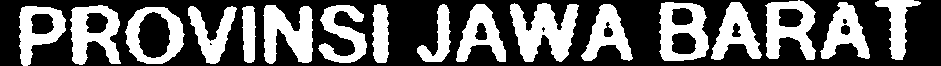

tesseract -  : 
custom result -  : W96hD-NDy171g191P


1/1 [==============================] - 0s 40ms/step
model pred idx: 20
model pred conf: 0.9999988079071045
model pred label: K


1/1 [==============================] - 0s 42ms/step
model pred idx: 0
model pred conf: 0.8115562200546265
model pred label: 0


1/1 [==============================] - 0s 46ms/step
model pred idx: 29
model pred conf: 0.9998205304145813
model pred label: T


1/1 [==============================] - 0s 42ms/step
model pred idx: 10
model pred conf: 0.6095179915428162
model pred label: A


1/1 [==============================] - 0s 31ms/step
model pred idx: 12
model pred conf: 0.9712656736373901
model pred label: C


1/1 [==============================] - 0s 29ms/step
model pred idx: 1
model pred conf: 0.9897987842559814
model pred label: 1


1/1 [==============================] - 0s 28ms/step
model pred idx: 22
model pred conf: 0.9849351644515991
model pred label: M


1/1 [==============================] - 0s 27ms/step
model pred idx: 10
model pred conf: 0.999186098575592
model pred label: A


1/1 [==============================] - 0s 26ms/step
model pred idx: 17
model pred conf: 0.9983001351356506
model pred label: H


1/1 [==============================] - 0s 26ms/step
model pred idx: 1
model pred conf: 0.9995760321617126
model pred label: 1


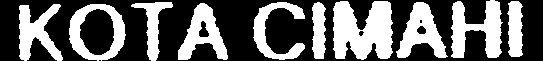

tesseract -  : 
custom result -  : A6P12DG14D


1/1 [==============================] - 0s 31ms/step
model pred idx: 3
model pred conf: 0.9999345541000366
model pred label: 3


1/1 [==============================] - 0s 30ms/step
model pred idx: 2
model pred conf: 0.9006171226501465
model pred label: 2


1/1 [==============================] - 0s 29ms/step
model pred idx: 7
model pred conf: 0.7829483151435852
model pred label: 7


1/1 [==============================] - 0s 28ms/step
model pred idx: 7
model pred conf: 0.9980826377868652
model pred label: 7


1/1 [==============================] - 0s 28ms/step
model pred idx: 0
model pred conf: 0.6088917255401611
model pred label: 0


1/1 [==============================] - 0s 36ms/step
model pred idx: 6
model pred conf: 0.945807933807373
model pred label: 6


1/1 [==============================] - 0s 25ms/step
model pred idx: 1
model pred conf: 0.4986754059791565
model pred label: 1


1/1 [==============================] - 0s 27ms/step
model pred idx: 8
model pred conf: 0.9999595880508423
model pred label: 8


1/1 [==============================] - 0s 28ms/step
model pred idx: 30
model pred conf: 0.6542894244194031
model pred label: U


1/1 [==============================] - 0s 31ms/step
model pred idx: 8
model pred conf: 0.9997144341468811
model pred label: 8


1/1 [==============================] - 0s 32ms/step
model pred idx: 7
model pred conf: 0.9987687468528748
model pred label: 7


1/1 [==============================] - 0s 30ms/step
model pred idx: 0
model pred conf: 0.4695594906806946
model pred label: 0


1/1 [==============================] - 0s 29ms/step
model pred idx: 32
model pred conf: 0.9973548650741577
model pred label: W


1/1 [==============================] - 0s 25ms/step
model pred idx: 7
model pred conf: 0.998320996761322
model pred label: 7


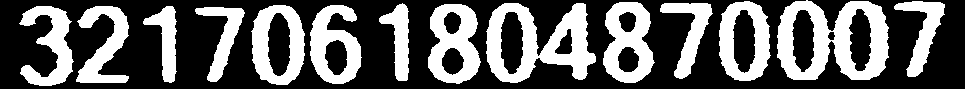

tesseract -  : 
custom result -  : /f886JDHXH8678


1/1 [==============================] - 0s 29ms/step
model pred idx: 22
model pred conf: 0.8541658520698547
model pred label: M


1/1 [==============================] - 0s 36ms/step
model pred idx: 14
model pred conf: 0.9999788999557495
model pred label: E


1/1 [==============================] - 0s 24ms/step
model pred idx: 15
model pred conf: 0.9999159574508667
model pred label: F


1/1 [==============================] - 0s 25ms/step
model pred idx: 32
model pred conf: 0.998649537563324
model pred label: W


1/1 [==============================] - 0s 29ms/step
model pred idx: 1
model pred conf: 0.9999295473098755
model pred label: 1


1/1 [==============================] - 0s 29ms/step
model pred idx: 19
model pred conf: 0.9857894778251648
model pred label: J


1/1 [==============================] - 0s 25ms/step
model pred idx: 10
model pred conf: 0.9956315755844116
model pred label: A


1/1 [==============================] - 0s 26ms/step
model pred idx: 34
model pred conf: 0.9834507703781128
model pred label: Y


1/1 [==============================] - 0s 26ms/step
model pred idx: 10
model pred conf: 0.9861195087432861
model pred label: A


1/1 [==============================] - 0s 24ms/step
model pred idx: 25
model pred conf: 0.9999996423721313
model pred label: P


1/1 [==============================] - 0s 22ms/step
model pred idx: 30
model pred conf: 0.9993126392364502
model pred label: U


1/1 [==============================] - 0s 22ms/step
model pred idx: 29
model pred conf: 0.9999269247055054
model pred label: T


1/1 [==============================] - 0s 27ms/step
model pred idx: 17
model pred conf: 0.5004025101661682
model pred label: H


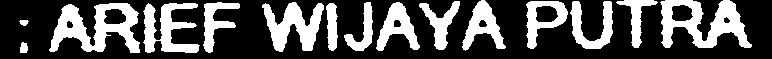

tesseract -  : : ARIEF WIJAYA PUTRA

custom result -  : G3t7Dy151WXP4


1/1 [==============================] - 0s 29ms/step
model pred idx: 17
model pred conf: 0.9824635982513428
model pred label: H


1/1 [==============================] - 0s 25ms/step
model pred idx: 23
model pred conf: 0.5274389386177063
model pred label: N


1/1 [==============================] - 0s 24ms/step
model pred idx: 32
model pred conf: 0.9750008583068848
model pred label: W


1/1 [==============================] - 0s 25ms/step
model pred idx: 22
model pred conf: 0.9971440434455872
model pred label: M


1/1 [==============================] - 0s 23ms/step
model pred idx: 3
model pred conf: 0.4923098385334015
model pred label: 3


1/1 [==============================] - 0s 25ms/step
model pred idx: 22
model pred conf: 0.7967966794967651
model pred label: M


1/1 [==============================] - 0s 23ms/step
model pred idx: 7
model pred conf: 0.5694839954376221
model pred label: 7


1/1 [==============================] - 0s 23ms/step
model pred idx: 26
model pred conf: 0.3534806966781616
model pred label: Q


1/1 [==============================] - 0s 33ms/step
model pred idx: 7
model pred conf: 0.9594683647155762
model pred label: 7


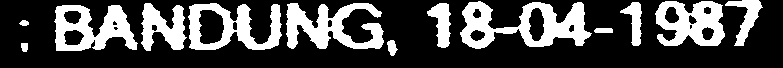

tesseract -  : ; BANDUNG, 18-04-1987

custom result -  : 4-7G/G8c8


1/1 [==============================] - 0s 32ms/step
model pred idx: 32
model pred conf: 0.9983375072479248
model pred label: W


1/1 [==============================] - 0s 27ms/step
model pred idx: 22
model pred conf: 0.8256667256355286
model pred label: M


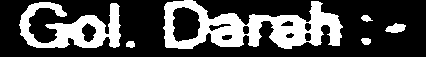

tesseract -  : 
custom result -  : 7G


1/1 [==============================] - 0s 25ms/step
model pred idx: 19
model pred conf: 0.9929692149162292
model pred label: J


1/1 [==============================] - 0s 25ms/step
model pred idx: 21
model pred conf: 0.9999958276748657
model pred label: L


1/1 [==============================] - 0s 22ms/step
model pred idx: 10
model pred conf: 0.9961758852005005
model pred label: A


1/1 [==============================] - 0s 25ms/step
model pred idx: 22
model pred conf: 0.9994001388549805
model pred label: M


1/1 [==============================] - 0s 23ms/step
model pred idx: 1
model pred conf: 0.9929123520851135
model pred label: 1


1/1 [==============================] - 0s 26ms/step
model pred idx: 27
model pred conf: 0.9927452206611633
model pred label: R


1/1 [==============================] - 0s 25ms/step
model pred idx: 22
model pred conf: 0.8827193975448608
model pred label: M


1/1 [==============================] - 0s 28ms/step
model pred idx: 17
model pred conf: 0.997653067111969
model pred label: H


1/1 [==============================] - 0s 28ms/step
model pred idx: 22
model pred conf: 0.9996358156204224
model pred label: M


1/1 [==============================] - 0s 24ms/step
model pred idx: 32
model pred conf: 0.9999802112579346
model pred label: W


1/1 [==============================] - 0s 24ms/step
model pred idx: 26
model pred conf: 0.6014190912246704
model pred label: Q


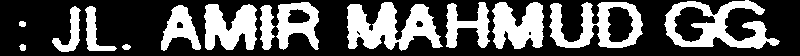

tesseract -  : 
custom result -  : yu1GD9G4G7c


1/1 [==============================] - 0s 23ms/step
model pred idx: 2
model pred conf: 0.5882182121276855
model pred label: 2


1/1 [==============================] - 0s 26ms/step
model pred idx: 27
model pred conf: 0.9979251623153687
model pred label: R


1/1 [==============================] - 0s 28ms/step
model pred idx: 22
model pred conf: 0.8893710970878601
model pred label: M


1/1 [==============================] - 0s 23ms/step
model pred idx: 26
model pred conf: 0.8878259062767029
model pred label: Q


1/1 [==============================] - 0s 23ms/step
model pred idx: 21
model pred conf: 0.9999978542327881
model pred label: L


1/1 [==============================] - 0s 26ms/step
model pred idx: 1
model pred conf: 0.9992749094963074
model pred label: 1


1/1 [==============================] - 0s 26ms/step
model pred idx: 17
model pred conf: 0.9912962913513184
model pred label: H


1/1 [==============================] - 0s 24ms/step
model pred idx: 22
model pred conf: 0.9984024167060852
model pred label: M


1/1 [==============================] - 0s 23ms/step
model pred idx: 27
model pred conf: 0.5389278531074524
model pred label: R


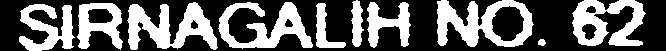

tesseract -  : 
custom result -  : f9GcuD4G9


1/1 [==============================] - 0s 25ms/step
model pred idx: 22
model pred conf: 0.999876856803894
model pred label: M


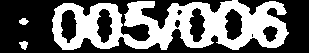

tesseract -  : 
custom result -  : G


1/1 [==============================] - 0s 23ms/step
model pred idx: 12
model pred conf: 0.9478870630264282
model pred label: C


1/1 [==============================] - 0s 23ms/step
model pred idx: 1
model pred conf: 0.9398364424705505
model pred label: 1


1/1 [==============================] - 0s 24ms/step
model pred idx: 22
model pred conf: 0.8040952086448669
model pred label: M


1/1 [==============================] - 0s 25ms/step
model pred idx: 29
model pred conf: 0.7738481760025024
model pred label: T


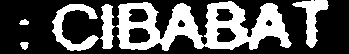

tesseract -  : 
custom result -  : 2DGP


tesseract -  : 
custom result -  : 


1/1 [==============================] - 0s 31ms/step
model pred idx: 1
model pred conf: 0.9996492862701416
model pred label: 1


1/1 [==============================] - 0s 29ms/step
model pred idx: 28
model pred conf: 0.986193835735321
model pred label: S


1/1 [==============================] - 0s 24ms/step
model pred idx: 30
model pred conf: 0.9987003803253174
model pred label: U


1/1 [==============================] - 0s 25ms/step
model pred idx: 22
model pred conf: 0.8616797924041748
model pred label: M


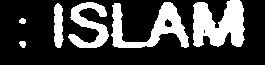

tesseract -  : mee)

custom result -  : DNXG


1/1 [==============================] - 0s 25ms/step
model pred idx: 22
model pred conf: 0.9989913105964661
model pred label: M


1/1 [==============================] - 0s 22ms/step
model pred idx: 1
model pred conf: 0.8591762185096741
model pred label: 1


1/1 [==============================] - 0s 26ms/step
model pred idx: 32
model pred conf: 0.9958993792533875
model pred label: W


1/1 [==============================] - 0s 24ms/step
model pred idx: 25
model pred conf: 0.9999957084655762
model pred label: P


1/1 [==============================] - 0s 22ms/step
model pred idx: 0
model pred conf: 0.5613039135932922
model pred label: 0


1/1 [==============================] - 0s 27ms/step
model pred idx: 5
model pred conf: 0.8456927537918091
model pred label: 5


1/1 [==============================] - 0s 24ms/step
model pred idx: 30
model pred conf: 0.39239200949668884
model pred label: U


1/1 [==============================] - 0s 26ms/step
model pred idx: 22
model pred conf: 0.9987367987632751
model pred label: M


1/1 [==============================] - 0s 22ms/step
model pred idx: 22
model pred conf: 0.8953774571418762
model pred label: M


1/1 [==============================] - 0s 23ms/step
model pred idx: 3
model pred conf: 0.6664143800735474
model pred label: 3


1/1 [==============================] - 0s 23ms/step
model pred idx: 20
model pred conf: 0.2567262351512909
model pred label: K


1/1 [==============================] - 0s 23ms/step
model pred idx: 14
model pred conf: 0.8132462501525879
model pred label: E


1/1 [==============================] - 0s 22ms/step
model pred idx: 21
model pred conf: 0.9998378753662109
model pred label: L


1/1 [==============================] - 0s 22ms/step
model pred idx: 30
model pred conf: 0.9996771812438965
model pred label: U


1/1 [==============================] - 0s 23ms/step
model pred idx: 22
model pred conf: 0.9979360103607178
model pred label: M


1/1 [==============================] - 0s 41ms/step
model pred idx: 22
model pred conf: 0.8215941190719604
model pred label: M


1/1 [==============================] - 0s 35ms/step
model pred idx: 22
model pred conf: 0.9990683197975159
model pred label: M


1/1 [==============================] - 0s 34ms/step
model pred idx: 23
model pred conf: 0.9924830794334412
model pred label: N


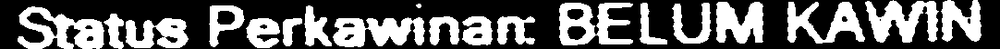

tesseract -  : Sratus Perkawinarn BELUM KAVWIN

custom result -  : GD7W6xXGG/A3uXGGG-


1/1 [==============================] - 0s 33ms/step
model pred idx: 14
model pred conf: 0.5098772048950195
model pred label: E


1/1 [==============================] - 0s 36ms/step
model pred idx: 32
model pred conf: 0.9999655485153198
model pred label: W


1/1 [==============================] - 0s 33ms/step
model pred idx: 10
model pred conf: 0.9923082590103149
model pred label: A


1/1 [==============================] - 0s 34ms/step
model pred idx: 27
model pred conf: 0.9894353747367859
model pred label: R


1/1 [==============================] - 0s 44ms/step
model pred idx: 22
model pred conf: 0.9998201727867126
model pred label: M


1/1 [==============================] - 0s 34ms/step
model pred idx: 10
model pred conf: 0.9994024038314819
model pred label: A


1/1 [==============================] - 0s 34ms/step
model pred idx: 17
model pred conf: 0.9967620372772217
model pred label: H


1/1 [==============================] - 0s 35ms/step
model pred idx: 22
model pred conf: 0.9999914169311523
model pred label: M


1/1 [==============================] - 0s 33ms/step
model pred idx: 10
model pred conf: 0.7448417544364929
model pred label: A


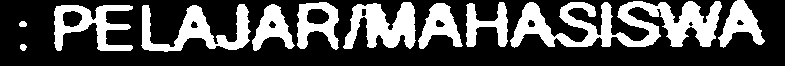

tesseract -  : : PELAJAR

IMAHASISW.

a

custom result -  : 3719G14G1


1/1 [==============================] - 0s 32ms/step
model pred idx: 20
model pred conf: 0.9997565150260925
model pred label: K


1/1 [==============================] - 0s 34ms/step
model pred idx: 22
model pred conf: 0.9999961853027344
model pred label: M


1/1 [==============================] - 0s 33ms/step
model pred idx: 5
model pred conf: 0.5614050626754761
model pred label: 5


1/1 [==============================] - 0s 41ms/step
model pred idx: 32
model pred conf: 0.46770286560058594
model pred label: W


1/1 [==============================] - 0s 35ms/step
model pred idx: 22
model pred conf: 0.9723730683326721
model pred label: M


1/1 [==============================] - 0s 35ms/step
model pred idx: 34
model pred conf: 0.5122028589248657
model pred label: Y


1/1 [==============================] - 0s 34ms/step
model pred idx: 24
model pred conf: 0.2957398295402527
model pred label: O


1/1 [==============================] - 0s 34ms/step
model pred idx: 11
model pred conf: 0.5398283004760742
model pred label: B


1/1 [==============================] - 0s 36ms/step
model pred idx: 2
model pred conf: 0.47661879658699036
model pred label: 2


1/1 [==============================] - 0s 33ms/step
model pred idx: 22
model pred conf: 0.9925302863121033
model pred label: M


1/1 [==============================] - 0s 32ms/step
model pred idx: 22
model pred conf: 0.9973057508468628
model pred label: M


1/1 [==============================] - 0s 36ms/step
model pred idx: 1
model pred conf: 0.9999481439590454
model pred label: 1


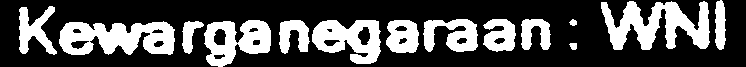

tesseract -  : Kewarganegaraan: WNi

custom result -  : AGx7G5mgfGGD


1/1 [==============================] - 0s 31ms/step
model pred idx: 28
model pred conf: 0.9016379714012146
model pred label: S


1/1 [==============================] - 0s 37ms/step
model pred idx: 14
model pred conf: 0.9999946355819702
model pred label: E


1/1 [==============================] - 0s 43ms/step
model pred idx: 30
model pred conf: 0.9987788796424866
model pred label: U


1/1 [==============================] - 0s 35ms/step
model pred idx: 22
model pred conf: 0.9499217867851257
model pred label: M


1/1 [==============================] - 0s 35ms/step
model pred idx: 30
model pred conf: 0.9998853206634521
model pred label: U


1/1 [==============================] - 0s 34ms/step
model pred idx: 27
model pred conf: 0.9463623762130737
model pred label: R


1/1 [==============================] - 0s 33ms/step
model pred idx: 17
model pred conf: 0.9958892464637756
model pred label: H


1/1 [==============================] - 0s 36ms/step
model pred idx: 1
model pred conf: 0.9846920371055603
model pred label: 1


1/1 [==============================] - 0s 37ms/step
model pred idx: 13
model pred conf: 0.9907128214836121
model pred label: D


1/1 [==============================] - 0s 43ms/step
model pred idx: 30
model pred conf: 0.988735020160675
model pred label: U


1/1 [==============================] - 0s 25ms/step
model pred idx: 25
model pred conf: 0.9999849796295166
model pred label: P


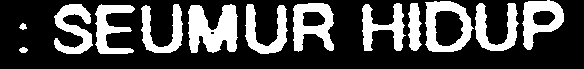

tesseract -  : mei tO) 10) aan O10

custom result -  : N3XGX94DdXW


In [ ]:
import pytesseract

for roi in ktp_roi:
  # padded = cv2.copyMakeBorder(roi, 12, 12, 12, 12, cv2.BORDER_CONSTANT)
  text_roi = grab_text(roi.copy(),-1)
  pred = get_text_roi(text_roi)
  extractedInformation = pytesseract.image_to_string(text_roi)
  cv2_imshow(text_roi)
  print(f"tesseract -  : {extractedInformation}")
  print(f"custom result -  : {''.join(pred)}")


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.
